# ISS sensitivity model

### Abstract

The sensitivity of an integrated superconducting spectrometer (ISS) on a ground-based mm-submm telescope can is modeled in the `Python` module `desim`.
The model assumes that the sensitivity of the MKIDs are limited by 1) photon-noise from the atmospheric foreground and 2) quasiparticle recombination noise.
In addition, the sensitivity of the instrument is limited by its optical efficiency, and its efficiency to couple to the telescope.

In the following we explain the model, and show some educative applications of the model. This should be interesting for understanding how an ISS works, and for making practical sensitivity predictions.

## Preparing the Python environment

### House Rules

- Avoid the use of global variables as much as possible.
    - Wrap calculations in functions

### Import python modules

In [30]:
# IPython extension to reload modules before executing user code.
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [31]:
import numpy as np
import pandas as pd

In [32]:
## Plotly 
import plotly as py
import plotly.graph_objs as go
import plotly.io as pio
import copy

py.offline.init_notebook_mode(connected=False)

In [33]:
## Matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

In [34]:
# plt.rcParams['font.size'] = 15 ## font size

In [35]:
h = 6.62607004 * 10**-34
k = 1.38064852 * 10**-23
e = 1.60217662 * 10**-19 # electron charge
c = 299792458.
Delta_Al = 188. * 10**-6 * e # gap energy of Al
eta_pb = 0.4 # pair-breaking efficiency (Guruswamy, Goldie and Witington 2014, Supercond. Sci. Technol. 27, 055012)

In [36]:
# Load desim package (Deshima SiMulator)
desim_path = '/Users/akira/desim'
import sys
sys.path.append(desim_path)
import desim as dsm # 
from Dl_at_z2 import Dl_at_z

## Sensitivity of a photon-noise limited MKID

The sensitivity of an ideal MKID is given by the following equation. (de Visser et al., Nature Communications 2014; PhD thesis Reinier Janssen)

\begin{equation}
\label{eq:NEPph}
\begin{split}
\mathrm{NEP_{ph}} &= \sqrt{2P_\mathrm{MKID}(hF+P_\mathrm{MKID}/\Delta F_\mathrm{cont})+4\Delta_\mathrm{Al} P_\mathrm{MKID}/\eta_\mathrm{pb}}\\
&=\sqrt{2P_\mathrm{MKID}hF(1+n_\mathrm{ph})+4\Delta_\mathrm{Al} P_\mathrm{MKID}/\eta_\mathrm{pb}}
\end{split}
\end{equation}

Notes:

- The first term in the square-root is photon noise, and the second term is quasiparticle recombination noise.
- The first term within the photon noise is the Poisson noise term, and the second term is Bunching noise.
- $P_\mathrm{MKID}$ is the power *absorbed* by the Al line in the MKID. 
    - There is no optical efficiency term in this equation because the reference is the power absorbed.
- Since we are calculating for a single spectrometer channel, we can assume that the bandwidth $\Delta F_\mathrm{cont}$ (see below for what 'cont' means) is sufficiently narrow to assume that $F$ is constant.
- For the derivation of the recombination noise term (especially the factor 4), see Flanigan et al., Appl. Phys. Lett. **108**, 083504 (2016)

### Note: in-band-fraction (IBF) and channel bandwidth

There is a subtlety in the definition of the channel bandwidth, in calulating the NEP.
The transmission of the on-chip filter is not a block function, and each channel receives some power from the frequency range of neighboring channels.
We define in-band fraction (IBF) as the fraction of the integrated response that is contaned within the nominal channel band, with respect to the total integrated response over all frequencies.
(for our exact technical definition please refer to this `kibela` page: https://deshima.kibe.la/notes/312)

In the model we define two *equivalent bandwidths*, $\Delta F_\mathrm{spec}$ and $\Delta F_\mathrm{cont}$, which are related as:

$$
\mathrm{IBF} = \frac{\Delta F_\mathrm{spec}}{\Delta F_\mathrm{cont}}
$$

- When we consider the loading we should take $\Delta F_\mathrm{cont}$, because the atmospheric loading is wideband.
- With respect to the astronomical signal, we take $\Delta F_\mathrm{cont}$ for continuum emission and $\Delta F_\mathrm{spec}$ for line emission.

When we talk about a spectrometer with R=500, we mean:



\begin{equation}
\begin{split}
R &= \frac{F}{\Delta F_\mathrm{spec}} = 500 \\
\Delta F_\mathrm{cont} &= \frac{\Delta F_\mathrm{spec}}{\mathrm{IBF}}
\end{split}
\end{equation}



### Photon occupation number (theory)

$n_\mathrm{ph}$ is the 'photon occupation number', and is given *in general* by:

\begin{equation}
\begin{split}
n_\mathrm{ph} &= \frac{P_\mathrm{MKID}}{\Delta F\cdot hF}\\
&=\frac{P_\mathrm{MKID}}{hF}\cdot \tau_\mathrm{coh}
\end{split}
\end{equation}

In other words, $n_\mathrm{ph}$ is the **number of photons that are detected per coherence time $\tau_\mathrm{coh}=1/\Delta F$**, where $\Delta F$ is the detection bandwidth.

- $n_\mathrm{ph}\ll 1\ \rightarrow$ Poisson limit
- $n_\mathrm{ph}\gg 1\ \rightarrow$ bunching limit

In the *special case* that the loading is equivalent to a single-temperature, opaque black-body, $n_\mathrm{ph}$ is the Bose-Einstein density of states.

$$
n_\mathrm{ph} = \frac{1}{\exp(hF/kT_\mathrm{load})-1}
$$

- Educative text to learn about the relevance of photon occupation number in the context of astronomy: Radhakrishnan, V., "Noise and Interferometry," Synthesis Imaging in Radio Astronomy II, A Collection of Lectures from the Sixth NRAO/NMIMT Synthesis Imaging Summer School. Edited by G. B. Taylor, C. L. Carilli, and R. A. Perley. ASP Conference Series, Vol. 180, 1999, p. 671. http://adsabs.harvard.edu/abs/1999ASPC..180..671R

#### Poisson limit 

If we neglect the recombination term and consider a fully photon-noise limited ideal detector, 

$$ 
\mathrm{NEP_{ph}} = \sqrt{2P_\mathrm{MKID}hF}
$$

#### Bunching limit

We again neglect the recombination term and consider a fully photon-noise limited ideal detector

$$ 
\mathrm{NEP_{ph}} = P_\mathrm{MKID}\sqrt{2/\Delta F}
$$

##### Bunching limit and RJ limit

If the loading is fully in the Rayleign-Jeans limit, i.e., $P_\mathrm{MKID}=k\cdot \Delta F\cdot T_\mathrm{load}$, then

$$ 
\mathrm{NEP_{ph}} = \sqrt{2}k \sqrt{\Delta F} T_\mathrm{load}
$$

This is the case for $T_\mathrm{RX}=0$. For a real instrument system, 1) the recombination term and 2) the finite optical efficiency result in a finite equivalent $T_\mathrm{RX}$. This will be discuss in detail later.

### Examples

Here we show the NEP as a funtion of $n_\mathrm{ph}$, $P_\mathrm{MKID}$ and $T_\mathrm{load}$ for several combinations of $F$ and $R$.
$T_\mathrm{load}$ is related to $n_\mathrm{ph}$ as follows (so not assuming Rayleigh-Jeans)

$$
n_\mathrm{ph} = \frac{1}{\exp(hF/kT_\mathrm{load})-1}
$$

In [37]:
def NEPdemo1(F=350e9, R=500):
    Tload = np.logspace(0.8,2,100)
    W_F = F/R
    nph = dsm.nph(F,Tload)
    Pkid = h*F*nph*W_F
    poisson_term = np.sqrt(2 * Pkid * h * F)
    bunching_term = np.sqrt(2 * Pkid * Pkid / W_F)
    r_term = np.sqrt(4 * Delta_Al * Pkid / eta_pb)
    NEP_total = np.sqrt(poisson_term**2 + bunching_term**2 + r_term**2)
        
    fig, ax1 = plt.subplots(1,1,figsize=(4,4)) # facecolor='w'
    ax1.loglog(nph,NEP_total,label='total')
    ax1.loglog(nph,poisson_term,label='Poisson')
    ax1.loglog(nph,bunching_term,label='Bunching')
    ax1.loglog(nph,r_term,label='Recombination')
      
    ax2 = ax1.twiny()
    ax2.loglog(nph,NEP_total,label='ax2')

    ax3 = ax1.twiny()
    ax3.spines["top"].set_position(("axes", 1.2))
    ax3.loglog(nph,NEP_total,label='ax3')
    
    ax1.set_xlim([min(nph),max(nph)])
    ax2.set_xlim([min(nph),max(nph)])
    ax3.set_xlim([min(nph),max(nph)])
    
    pow10 = np.arange(-20,-10)
    pow10 = pow10[(pow10>=np.log10(min(Pkid))) & (pow10<=np.log10(max(Pkid)))]
    
    pow10_T = np.arange(0,3)
    pow10_T = pow10_T[(pow10_T>=np.log10(min(Tload))) & (pow10_T<=np.log10(max(Tload)))]
    
    tick_Pkid = 10.**pow10
    tick_Tload = 10.**pow10_T
    
    tick_nph = tick_Pkid/(h*F*W_F)
    ax2.set_xticks(tick_nph)
    ax2.set_xticklabels(tick_Pkid)
    
    tick_nph_T = dsm.nph(F,tick_Tload)
    ax3.set_xticks(tick_nph_T)
    ax3.set_xticklabels(tick_Tload)
    
    ax1.tick_params(direction='in',which='both')
    ax2.tick_params(direction='in',which='both')
    ax3.tick_params(direction='in',which='both')
    
    ax1.set_xlabel('$n_\mathrm{ph}$')
    ax2.set_xlabel('P (W)')
    ax3.set_xlabel('$\mathrm{Planck}\ T_\mathrm{load} (K)$')
    
    ax1.set_ylabel('$\mathrm{NEP\ (W\ Hz^{-0.5})}$')
    
    ax1.legend()
    
    ax2.set_title('F='+'{:d}'.format(round(F/1e9),3)+'GHz, R='+'{:d}'.format(round(R),3),y=1.35)

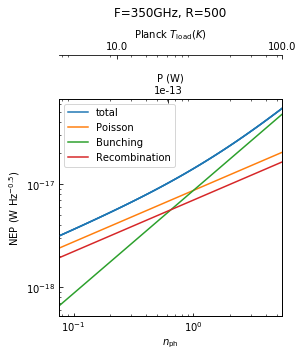

In [38]:
'''
The tipping point from Poisson to Bunching is where n_ph = 1.
This is around T_load ~ 50K, P_load ~ 100 fW around 350 GHz, R=500
'''
NEPdemo1(F=350e9, R=500)

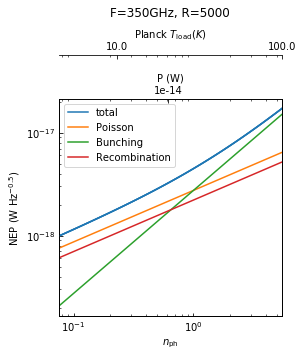

In [39]:
'''
A differnt R changes the power and NEP, 
but it does not affect the tipping point 
from Poisson to Bunching when plotted against T_load and n_ph.
'''
NEPdemo1(F=350e9, R=5000)

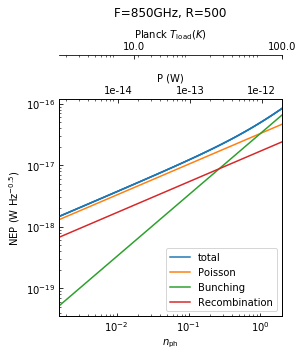

In [40]:
'''
Higher F pushes the Poisson/Bunching tipping point to higher T_load.
Conversely, at higher F the systems is more likely to be in the Poisson limit.
'''
NEPdemo1(F=850e9, R=500)

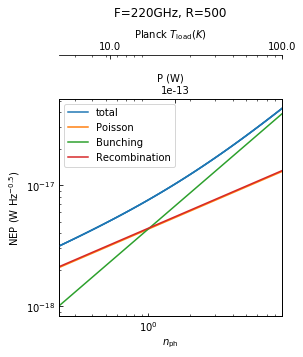

In [41]:
'''
At 220 GHz, Poisson and Recombination noise are nearly equal!
'''
NEPdemo1(F=220e9, R=500)

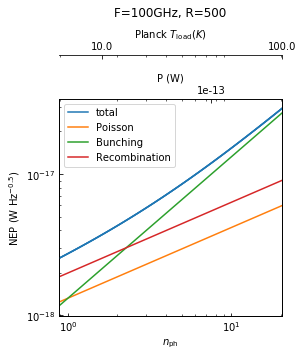

In [42]:
'''
At 100 GHz, Recombinatino noise is higher than Poisson noise.
'''
NEPdemo1(F=100e9, R=500)

## Calculating the atmospheric loading on the MKID in an instrument

In a photon-noise limited measurement, the *noise* is set by the amount of loading on the detector, $P_\mathrm{MKID}$.
Here we will neglect the contribution of the weak signal from the astronomical source to the detector loading.



### Use of Johnson-Nyquist PSD

The script uses the Johnson-Nyquist PSD (and not brightness temperature) to calculate the power:
$$
\mathrm{PSD_{JN}} = \frac{hF}{\exp(hF/kT_\mathrm{load})-1}
$$
In general the power is obtained by multiplying the PSD with the bandwidth.
$$
P_\mathrm{JN} = \mathrm{PSD_{JN}} \times \Delta F
$$

### List of elements that influence the loading

We use simple radiation transfer theory to cascade the emission and loss of the following elements.

- CMB: Temperature of 2.725 K. It is important that the power is calculated from the Planck formula because the submm is on the Wien side for this temperature.
- The atmosphere:
    - temperature assumed to be at $T_\mathrm{amb}$, which is the same as the ground.
    - transmission $\eta_\mathrm{atm}$ calculated as a function of PWV and frequency
        - https://almascience.eso.org/about-alma/atmosphere-model
- The warm optics, which is further decomposed into
    - The primary mirror 
        - $T_\mathrm{amb}$
        - $\eta_\mathrm{M1}=\eta_\mathrm{M1,ohmic}\eta_\mathrm{M1,spill}$
    - The secondary mirror
        - $\eta_\mathrm{M2,ohmic}$ coupled to $T_\mathrm{amb}$
        - $\eta_\mathrm{M2,spill}$ coupled to $T_\mathrm{sky}$
    - The cabin optics
        - $T_\mathrm{cabin}$
        - $\eta_\mathrm{wo}$, product of spill over and ohmic losses
- The cryostat window
    - Model developed by Stephen. See below.
- The cold optics
    - $T_\mathrm{co}$
    - $\eta_\mathrm{co}$: Loss of the cold optics, see below for the model.
- The chip at ~120 mK, having a negligible emission and only losses
    - $\eta_\mathrm{chip}= \eta_\mathrm{lens-antenna-rad}\eta_\mathrm{circuit}$
        - $\eta_\mathrm{lens-antenna-rad}$: Loss of the on-chip antenna with a finite radiation efficiency, see below for the model.
        - $\eta_\mathrm{circuit}$: Loss in the circuit, see below for the model.

### Definition: Forward efficiency

The beam looking out of the crysotat sees partially the cold sky ($T_\mathrm{sky}$, which is the brightness temperature of the semitrasparent sky), and partially the warmer cabin (physical temperature $T_\mathrm{cabin}$) and ground (physical temperature $T_\mathrm{amb}$). The fraction of the power pattern looking at the sky is called *forward efficiency,* $\eta_\mathrm{fwd}$. Here it should be noted that the spillover of the telescope secondary is pointed to the cold sky.

### Atmosphere

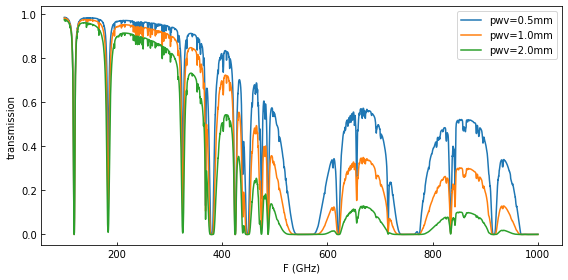

In [43]:
def atmosphere_demo1():
    hoge = 1
    F = np.linspace(100,1000,9001)
    R = 500.
    pwvarr = [0.5,1,2]
    EL = 60.
    
    fig, ax = plt.subplots(1,1,figsize=(8,4)) # facecolor='w'
    
    for ind in range(len(pwvarr)):
        pwv = pwvarr[ind]
        eta = dsm.eta_atm_func(F,pwv,EL=EL,R=R)
        ax.plot(F,eta,label='pwv='+'{:.1f}'.format(pwv)+'mm')
        
    ax.set_xlabel("F (GHz)")
    ax.set_ylabel("transmission")
    ax.tick_params(direction='in',which='both') 
    plt.legend()
    plt.tight_layout()

atmosphere_demo1()

### Sky temperature

In [44]:
def D2HPBW(F):
    HPBW = 29.*240./(F/1e9) * np.pi / 180. / 60. / 60.
    return HPBW

def eta_mb_ruze(F, LFlimit, sigma):
    '''F in Hz, LFlimit is the eta_mb at => 0 Hz, sigma in m'''
    eta_mb = LFlimit* np.exp(- (4.*np.pi* sigma * F/c)**2. )
    return eta_mb

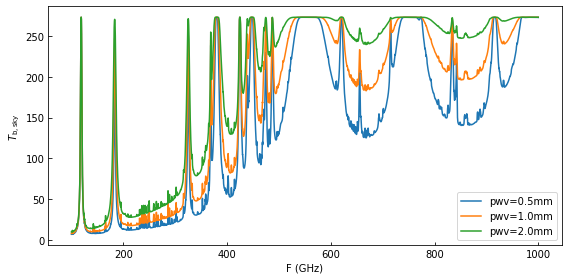

In [45]:
def Tskydemo2():
    F = np.linspace(100,1000,9001)*1e9
    HPBW = D2HPBW(F)
    eta_mb = eta_mb_ruze(F=F,LFlimit=0.8,sigma=37e-6) * 0.9 # see specs, 0.9 is from EM, ruze is from ASTE

    fig, ax = plt.subplots(1,1,figsize=(8,4)) # facecolor='w'
    
    pwvarr = [0.5,1,2]
    
    for pwv in pwvarr:
        D2goal_input ={
            'F' : F,
            'pwv':pwv,
            'EL':60.,
            'R' : 500,
            'eta_M1_spill' : 0.99,
            'eta_M2_spill' : 0.90,
            'eta_wo' : 0.99,
            'eta_co' : 0.65, # product of co spillover, qo filter
            'eta_lens_antenna_rad' : 0.81, # D2_2V3.pdf, p14: front-to-back ratio 0.93 * reflection efficiency 0.9 * matching 0.98 * antenna spillover 0.993
            'eta_circuit' : 0.35, # 'Alejandro Efficiency', from the feedpoint of the antenna to being absorbed in the KID.
            'eta_IBF' : 0.6,
            'KID_excess_noise_factor' : 1.1,
            'theta_maj' : HPBW,
            'theta_min' : HPBW,
            'eta_mb' : eta_mb,
            'Tb_cmb' : 2.725,
            'Tp_amb' : 273.,
            'Tp_cabin' : 290.,
            'Tp_co' : 4.,
            'Tp_chip' : 0.12,
            'snr' : 5,
            'obs_hours' :8.,
            'on_source_fraction':0.4*0.9 # ON-OFF 40%, calibration overhead of 10%
        }

        D2goal = dsm.spectrometer_sensitivity(**D2goal_input)


        ax.plot(D2goal['F']/1e9,
                    D2goal['Tb_sky'],
                    label='pwv='+'{:.1f}'.format(pwv)+'mm'
                   )
    
    ax.set_xlabel("F (GHz)")
    ax.set_ylabel("$T_\mathrm{b, sky}$")
#     ax.set_ylim([0,3])
    ax.tick_params(direction='in',which='both')
    plt.legend()
    plt.tight_layout()

Tskydemo2()

### Model of the cryostat window

The window is made of HDPE, with a refractive index of $n_\mathrm{HDPE}$=1.52. The reflection coefficient at one vacuum/HDPE interface is

$$
r_\mathrm{HDPE} = \Biggl(\frac{1-n_\mathrm{HDPE}}{1+n_\mathrm{HDPE}}\Biggr)^2 = 0.0425
$$








The dielectric loss in the HDPE is

$$
\eta_\mathrm{HDPE}=\exp \{-t_\mathrm{HDPE}^2 \times 2\pi n_\mathrm{HDPE}\times (\frac{\tan \delta}{\lambda} +  \frac{\tan^2 \delta}{\lambda^2})\} = 0.957
$$

where $t_\mathrm{HDPE}$=8 mm is the thickness of the window.

In calculating the loading and transmission, we make the following approximations:

- Each reflection is a pure loss, i.e., seen from the cold, what is reflected at each surface is assumed to be coupled to the cold. I ignore multiple reflections and interferences.
- So reflection couples to $T_\mathrm{co}$, and dielectric loss couples to $T_\mathrm{cabin}$

Hence the transmission (used for calculating signal loss) is

$$
\eta_\mathrm{window}=\eta_\mathrm{HDPE}(1-r_\mathrm{HDPE})^2 = 0.877
$$

and the PSD after the window is calculated as ($r$ is $r_\mathrm{HDPE}$):
$$ 
\mathrm{PSD_{out}} = \bigl(\{\mathrm{PSD_{in}}(1-r) + \mathrm{PSD_{co}}r\}\eta_\mathrm{HDPE} + \mathrm{PSD_{cabin}}(1-\eta_\mathrm{HDPE})\bigr)(1-r) + \mathrm{PSD_{co}}r
$$

In [46]:
def window_trans_demo1(
        F=350e9,
        thickness=8.e-3,    # in m
        tandelta=4.805e-4,  # tan delta, measured Biorad
        tan2delta=1.e-8,
        neffHDPE=1.52,
        ):

    HDPErefl = ((1-neffHDPE)/(1+neffHDPE))**2
    print(HDPErefl)
    eta_HDPE = np.exp(-thickness * 2 * np.pi * neffHDPE *
                      (tandelta * F / c + tan2delta * (F / c)**2))
    print(eta_HDPE)
    eta_window = (1.-HDPErefl)**2 * eta_HDPE
    print(eta_window)
window_trans_demo1()

0.042579994960947345
0.957048149619
0.877281120705


### Model of the cold optics

For the cold optics of DESHIMA 2.0 we assume $\eta_\mathrm{co}$=0.65, as the product of cold spillover (<5% loss; D2_2V3.pdf, p14) and QO filter transmission ($\ge$ 70% transmission).

### Model of the lens-antenna

Product of the following (D2_2V3.pdf, p14):
- front-to-back ratio 0.93 
- reflection efficiency 0.9
- matching 0.98 
- antenna spillover 0.993

### Model of the circuit loss
Loss from the feedpoint of the antenna to being absorbed in the KID: 'Alejandro efficiency'. We take 0.32 for DESHIMA 2.0.

### Calculating the MKID loading

By cascading radiaiton transfer we calculate $P_\mathrm{MKID}$.

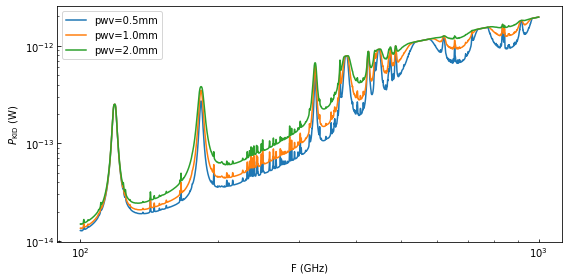

In [47]:
def Pkiddemo1():
    F = np.linspace(100,1000,9001)*1e9
    HPBW = D2HPBW(F)
    eta_mb = eta_mb_ruze(F=F,LFlimit=0.8,sigma=37e-6) * 0.9 # see specs, 0.9 is from EM, ruze is from ASTE

    fig, ax = plt.subplots(1,1,figsize=(8,4)) # facecolor='w'
    
    pwvarr = [0.5,1,2]
    
    for pwv in pwvarr:
        D2goal_input ={
            'F' : F,
            'pwv':pwv,
            'EL':60.,
            'R' : 500,
            'eta_M1_spill' : 0.99,
            'eta_M2_spill' : 0.90,
            'eta_wo' : 0.99,
            'eta_co' : 0.65, # product of co spillover, qo filter
            'eta_lens_antenna_rad' : 0.81, # D2_2V3.pdf, p14: front-to-back ratio 0.93 * reflection efficiency 0.9 * matching 0.98 * antenna spillover 0.993
            'eta_circuit' : 0.35, # 'Alejandro Efficiency', from the feedpoint of the antenna to being absorbed in the KID.
            'eta_IBF' : 0.6,
            'KID_excess_noise_factor' : 1.1,
            'theta_maj' : HPBW,
            'theta_min' : HPBW,
            'eta_mb' : eta_mb,
            'Tb_cmb' : 2.725,
            'Tp_amb' : 273.,
            'Tp_cabin' : 290.,
            'Tp_co' : 4.,
            'Tp_chip' : 0.12,
            'snr' : 5,
            'obs_hours' :8.,
            'on_source_fraction':0.4*0.9 # ON-OFF 40%, calibration overhead of 10%
        }

        D2goal = dsm.spectrometer_sensitivity(**D2goal_input)

        ax.loglog(D2goal['F']/1e9,
                    D2goal['Pkid'],
                  label='pwv='+'{:.1f}'.format(pwv)+'mm'
                   )
    
    ax.set_xlabel("F (GHz)")
    ax.set_ylabel("$P_\mathrm{KID}\ \mathrm{(W)}$")
#     ax.set_ylim([0,3])
    ax.tick_params(direction='in',which='both')
    plt.legend()
    plt.tight_layout()

Pkiddemo1()

## Calculating the signal coupling to the astronomical source

The signal loss is from the source to the cryostat window is

$$
\eta_\mathrm{sw}= \eta_\mathrm{pol} \cdot \eta_\mathrm{atm} \cdot \eta_\mathrm{A} \cdot \eta_\mathrm{fwd}
$$

Here, $\eta_\mathrm{pol}$=0.5 for single polarization, and the aperture efficiency $\eta_\mathrm{A}$ is

\begin{equation}
\begin{split}
\eta_\mathrm{A} &= \frac{A_\mathrm{e}}{A_\mathrm{p}}\\
&=\frac{\lambda^2}{A_\mathrm{p}}\frac{\eta_\mathrm{MB}}{\Omega_\mathrm{MB}}
\end{split}
\end{equation}

The instrument optical efficiency is

$$
\eta_\mathrm{inst} = \eta_\mathrm{chip} \cdot \eta_\mathrm{co} \cdot \eta_\mathrm{window}
$$


The total signal loss is given by $\eta_\mathrm{sw}\eta_\mathrm{inst}$.

## MKID- and instrument-NEP

$$ 
\mathrm{NEP}_\mathrm{inst} = \frac{\mathrm{NEP}_\mathrm{MKID}}{\eta_\mathrm{inst}}
$$

### MKID NEP of DESHIMA 2.0

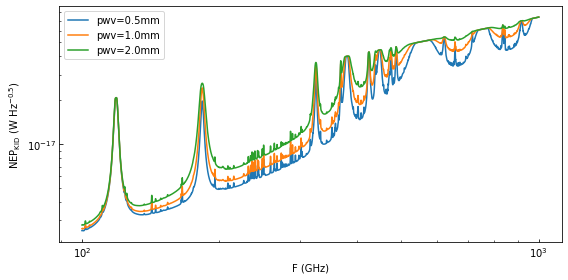

In [48]:
def NEPkiddemo1():
    F = np.linspace(100,1000,9001)*1e9
    HPBW = D2HPBW(F)
    eta_mb = eta_mb_ruze(F=F,LFlimit=0.8,sigma=37e-6) * 0.9 # see specs, 0.9 is from EM, ruze is from ASTE

    fig, ax = plt.subplots(1,1,figsize=(8,4)) # facecolor='w'
    
    pwvarr = [0.5,1,2]
    
    for pwv in pwvarr:
        D2goal_input ={
            'F' : F,
            'pwv':pwv,
            'EL':60.,
            'R' : 500,
            'eta_M1_spill' : 0.99,
            'eta_M2_spill' : 0.90,
            'eta_wo' : 0.99,
            'eta_co' : 0.65, # product of co spillover, qo filter
            'eta_lens_antenna_rad' : 0.81, # D2_2V3.pdf, p14: front-to-back ratio 0.93 * reflection efficiency 0.9 * matching 0.98 * antenna spillover 0.993
            'eta_circuit' : 0.35, # 'Alejandro Efficiency', from the feedpoint of the antenna to being absorbed in the KID.
            'eta_IBF' : 0.6,
            'KID_excess_noise_factor' : 1.1,
            'theta_maj' : HPBW,
            'theta_min' : HPBW,
            'eta_mb' : eta_mb,
            'Tb_cmb' : 2.725,
            'Tp_amb' : 273.,
            'Tp_cabin' : 290.,
            'Tp_co' : 4.,
            'Tp_chip' : 0.12,
            'snr' : 5,
            'obs_hours' :8.,
            'on_source_fraction':0.4*0.9 # ON-OFF 40%, calibration overhead of 10%
        }

        D2goal = dsm.spectrometer_sensitivity(**D2goal_input)

        ax.loglog(D2goal['F']/1e9,
                    D2goal['NEPkid'],
                  label='pwv='+'{:.1f}'.format(pwv)+'mm'
                   )
    
    ax.set_xlabel("F (GHz)")
    ax.set_ylabel("$\mathrm{NEP}_\mathrm{KID}\ \mathrm{(W\ Hz^{-0.5})}$")
#     ax.set_ylim([0,3])
    ax.tick_params(direction='in',which='both')
    plt.legend()
    plt.tight_layout()

NEPkiddemo1()

## NEFD

The noise equivalent flux density is given by
$$
\mathrm{NEFD} = \frac{\mathrm{NEP_\mathrm{inst}}}{\sqrt{2}\eta_\mathrm{sw}A_\mathrm{g}\Delta F}
$$
Here, $\sqrt{2}$ is because NEP is defined for 0.5 s integration. **See note on chopping penalty below**

### Note on the chipping penalty

Note that the NEFD will degrade by another factor $\sqrt{2}$ if the observation is ON-OFF, because the signal difference includes 2 times the noise. *Separately,* $\tau_\mathrm{on-source}$ is less than the total observing time by *at least* a factor of two, depending on the chopping overhead (40% is the goal requirement of DESHIMA 2.0)

\begin{equation}
\begin{split}
\mathrm{NEFD_\mathrm{ON-OFF}}&=\frac{\mathrm{NEP_\mathrm{inst}}}{\sqrt{2}\eta_\mathrm{sw}A_\mathrm{g}\Delta F}\cdot \sqrt{2} \\
\tau_\mathrm{on-source}&\le 0.5 \tau_\mathrm{obs}
\end{split}
\end{equation}


### Note on NEFD and in-band-fraction (IBF): line vs continuum

- IBF (in-band-fraction): see https://deshima.kibe.la/notes/312

The relation between NEFD for continuum and line signals is
$$
\mathrm{NEFD}_\mathrm{cont} = \mathrm{NEFD}_\mathrm{line}\times \mathrm{IBF}
$$
because in the case of a continuum signal there is signal availabel outside of the nominal channel bandwidth.

### NEFD of DESHIMA 2.0

In [49]:
def NEFDdemo1():
    # F = 3.5e11 # single frequency
    F = np.linspace(100,1000,9001)*1e9
    HPBW = D2HPBW(F)
    eta_mb = eta_mb_ruze(F=F,LFlimit=0.8,sigma=37e-6) * 0.9 # see specs, 0.9 is from EM, ruze is from ASTE

    D2goal_input ={
        'F' : F,
        'pwv':0.5,
        'EL':60.,
        'R' : 500,
        'eta_M1_spill' : 0.99,
        'eta_M2_spill' : 0.90,
        'eta_wo' : 0.99,
        'eta_co' : 0.65, # product of co spillover, qo filter
        'eta_lens_antenna_rad' : 0.81, # D2_2V3.pdf, p14: front-to-back ratio 0.93 * reflection efficiency 0.9 * matching 0.98 * antenna spillover 0.993
        'eta_circuit' : 0.35, # 'Alejandro Efficiency', from the feedpoint of the antenna to being absorbed in the KID.
        'eta_IBF' : 0.6,
        'KID_excess_noise_factor' : 1.1,
        'theta_maj' : HPBW,
        'theta_min' : HPBW,
        'eta_mb' : eta_mb,
        'Tb_cmb' : 2.725,
        'Tp_amb' : 273.,
        'Tp_cabin' : 290.,
        'Tp_co' : 4.,
        'Tp_chip' : 0.12,
        'snr' : 5,
        'obs_hours' :8.,
        'on_source_fraction':0.4*0.9 # ON-OFF 40%, calibration overhead of 10%
    }

    D2goal = dsm.spectrometer_sensitivity(**D2goal_input)

    # Display results for the 350 GHz channel as a table
    ind = (D2goal['F']-350e9).abs().idxmin()
#     D2goal[ind:ind+1].transpose().loc[['eta_inst','NEFD_line']]
    return D2goal[ind:ind+1].transpose()

NEFDdemo1()

,2500
F,3.500000e+11
PWV,5.000000e-01
EL,6.000000e+01
eta_atm,9.015443e-01
R,5.000000e+02
W_F_spec,7.000000e+08
W_F_cont,1.166667e+09
theta_maj,9.640866e-05
theta_min,9.640866e-05
eta_a,4.756452e-01


In [68]:
def NEFDdemo3_short():
    # F = 3.5e11 # single frequency
    F = np.linspace(100,1000,9001)*1e9
    HPBW = D2HPBW(F)
    eta_mb = eta_mb_ruze(F=F,LFlimit=0.8,sigma=37e-6) * 0.9 # see specs, 0.9 is from EM, ruze is from ASTE

    D2goal_input ={
        'F' : F,
        'pwv':0.5,
        'EL':60.,
        'R' : 500,
        'eta_M1_spill' : 0.99,
        'eta_M2_spill' : 0.90,
        'eta_wo' : 0.99,
        'eta_co' : 0.65, # product of co spillover, qo filter
        'eta_lens_antenna_rad' : 0.81, # D2_2V3.pdf, p14: front-to-back ratio 0.93 * reflection efficiency 0.9 * matching 0.98 * antenna spillover 0.993
        'eta_circuit' : 0.35, # 'Alejandro Efficiency', from the feedpoint of the antenna to being absorbed in the KID.
        'eta_IBF' : 0.6,
        'KID_excess_noise_factor' : 1.1,
        'theta_maj' : HPBW,
        'theta_min' : HPBW,
        'eta_mb' : eta_mb,
        'Tb_cmb' : 2.725,
        'Tp_amb' : 273.,
        'Tp_cabin' : 290.,
        'Tp_co' : 4.,
        'Tp_chip' : 0.12,
        'snr' : 5,
        'obs_hours' :8.,
        'on_source_fraction':0.4*0.9 # ON-OFF 40%, calibration overhead of 10%
    }

    D2goal = dsm.spectrometer_sensitivity(**D2goal_input)

    # Display results for the 350 GHz channel as a table
    ind = (D2goal['F']-350e9).abs().idxmin()
    return D2goal[ind:ind+1].transpose().loc[['eta_inst','NEFD_line']]

NEFDdemo3_short()

,2500
eta_inst,1.616610e-01
NEFD_line,5.736755e-27


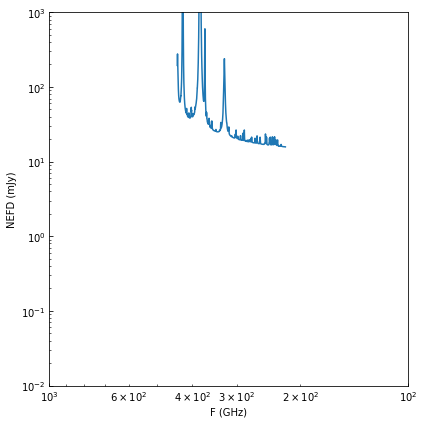

In [50]:
def NEFDdemo2():
    # F = 3.5e11 # single frequency
    F = np.linspace(220,440,2201)*1e9
    HPBW = D2HPBW(F)
    eta_mb = eta_mb_ruze(F=F,LFlimit=0.8,sigma=37e-6) * 0.9 # see specs, 0.9 is from EM, ruze is from ASTE

    D2goal_input ={
        'F' : F,
        'pwv':0.5,
        'EL':60.,
        'R' : 500,
        'eta_M1_spill' : 0.99,
        'eta_M2_spill' : 0.90,
        'eta_wo' : 0.99,
        'eta_co' : 0.65, # product of co spillover, qo filter
        'eta_lens_antenna_rad' : 0.81, # D2_2V3.pdf, p14: front-to-back ratio 0.93 * reflection efficiency 0.9 * matching 0.98 * antenna spillover 0.993
        'eta_circuit' : 0.35, # 'Alejandro Efficiency', from the feedpoint of the antenna to being absorbed in the KID.
        'eta_IBF' : 0.6,
        'KID_excess_noise_factor' : 1.1,
        'theta_maj' : HPBW,
        'theta_min' : HPBW,
        'eta_mb' : eta_mb,
        'Tb_cmb' : 2.725,
        'Tp_amb' : 273.,
        'Tp_cabin' : 290.,
        'Tp_co' : 4.,
        'Tp_chip' : 0.12,
        'snr' : 5,
        'obs_hours' :8.,
        'on_source_fraction':0.4*0.9 # ON-OFF 40%, calibration overhead of 10%
    }

    D2goal = dsm.spectrometer_sensitivity(**D2goal_input)

#     print(D2goal['F'])
#     print(D2goal['NEFD_line'])
    
    SNR = 5
    t_obs = 8 * 60 * 60
    on_source_fraction = 0.4
    
    fig, ax = plt.subplots(1,1,figsize=(6,6)) # facecolor='w'
    ax.loglog(D2goal['F']/1e9,
                D2goal['NEFD_line']*10**29 * SNR / np.sqrt(t_obs*on_source_fraction)
               )
    ax.set_xlabel("F (GHz)")
    ax.set_ylabel("NEFD (mJy)")
    ax.set_xlim([1000,100])
    ax.set_ylim([1e-2,1e3])
    ax.tick_params(direction='in',which='both')
    plt.tight_layout()
#     plt.savefig("NEFD.pdf",bbox_inches="tight")

NEFDdemo2()

With some image post processing, this plot is combined a figure taken from https://arxiv.org/abs/1903.04779

<img src="./fig/NEFD_SED.jpeg" width="400">



## MDLF of DESHIMA 2.0

The minimum detectable line flux is given by
$$
\mathrm{MDLF}=\mathrm{NEFD\cdot\Delta F}\cdot \frac{\mathrm{\mathrm{SNR}}}{\sqrt{\tau_\mathrm{on-source}}}
$$

In [51]:
def co_luminosity(z, d_l, f_obs, int):
    c1, c2 = 3.25e+07, 1.04e-03
    #Lp  = c1 * int * d_l**2 / (f_obs**2 * (1 + z)**3 )
    L   = c2 * int * d_l**2 * f_obs
    return L


def flux_from_line_luminosity(z, d_l, f_obs, L):
    """
        d_l - luminosity distance (Mpc)
        f_obs - observing frequency (GHz)
        L - line luminosity (L_Sun)
    """
    
    L_for1Jykms = co_luminosity(z, d_l, f_obs,  1.000) ## Lsun
    F_for1Jykms = 1.000 * 1e-26 * (f_obs  * 1e9 / 299792.458) ## W m^-2

    return L * (F_for1Jykms / L_for1Jykms)

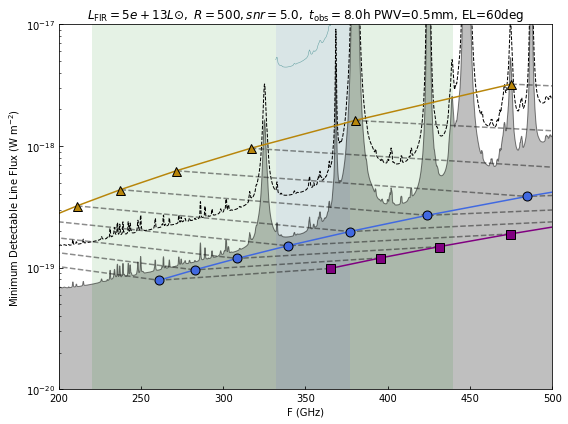

In [71]:
def MDLFdemo1():
    
    F = np.linspace(100,1000,9001)*1e9 # frequency range
    # F = 3.5e11 # single frequency
    HPBW = D2HPBW(F)
    eta_mb = eta_mb_ruze(F=F,LFlimit=0.8,sigma=37e-6) * 0.9 # see specs, 0.9 is from EM, ruze is from ASTE
    
    D2goal_input ={
        'F' : F,
        'pwv':0.5,
        'EL':60.,
        'R' : 500,
        'eta_M1_spill' : 0.99,
        'eta_M2_spill' : 0.90,
        'eta_wo' : 0.99,
        'eta_co' : 0.65, # product of co spillover, qo filter
        'eta_lens_antenna_rad' : 0.81, # D2_2V3.pdf, p14: front-to-back ratio 0.93 * reflection efficiency 0.9 * matching 0.98 * antenna spillover 0.993
        'eta_circuit' : 0.35, # 'Alejandro Efficiency', from the feedpoint of the antenna to being absorbed in the KID.
        'eta_IBF' : 0.6,
        'KID_excess_noise_factor' : 1.1,
        'theta_maj' : HPBW,
        'theta_min' : HPBW,
        'eta_mb' : eta_mb,
        'Tb_cmb' : 2.725,
        'Tp_amb' : 273.,
        'Tp_cabin' : 290.,
        'Tp_co' : 4.,
        'Tp_chip' : 0.12,
        'snr' : 5,
        'obs_hours' :8.,
        'on_source_fraction':0.4*0.9 # ON-OFF 40%, calibration overhead of 10%
    }

    D2goal = dsm.spectrometer_sensitivity(**D2goal_input)
    
    
    D2baseline_input = {
        'F' : F,
        'pwv':0.5,
        'EL':60.,
        'R' : 500, # <= Goal is 500
        'eta_M1_spill' : 0.99,
        'eta_M2_spill' : 0.90,
        'eta_wo' : 0.99,
        'eta_co' : 0.65, # product of co spillover, qo filter
        'eta_lens_antenna_rad' : 0.81, # D2_2V3.pdf, p14: front-to-back ratio 0.93 * reflection efficiency 0.9 * matching 0.98 * antenna spillover 0.993
        'eta_circuit' : 0.35 * 0.5, # <= eta_inst Goal 16%, Baseline 8% 
        'eta_IBF' : 0.4, # <= Goal 0.6 
        'KID_excess_noise_factor' : 1.2, # Goal 1.1
        'theta_maj' : HPBW,
        'theta_min' : HPBW,
        'eta_mb' : eta_mb,
        'Tb_cmb' : 2.725,
        'Tp_amb' : 273.,
        'Tp_cabin' : 290.,
        'Tp_co' : 4.,
        'Tp_chip' : 0.12,
        'snr' : 5,
        'obs_hours' :8.,
        'on_source_fraction':0.3*0.8/1.2 # <= Goal 0.4*0.9/1.1
    }
    
    D2baseline = dsm.spectrometer_sensitivity(**D2baseline_input)
    
    F_D1 = np.linspace(332,377,100)*1e9 # frequency range
    # F = 3.5e11 # single frequency

    D1_input ={
        'F' : F_D1,
        'pwv':1.5,
        'EL':60.,
        'R' : 380,
        'eta_M1_spill' : 0.99,
        'eta_M2_spill' : 0.90,
        'eta_wo' : 0.99,
        'eta_co' : 0.65, # product of co spillover, qo filter
        'eta_lens_antenna_rad' : 0.81, # D2_2V3.pdf, p14: front-to-back ratio 0.93 * reflection efficiency 0.9 * matching 0.98 * antenna spillover 0.993
        'eta_circuit' : 0.35 * 0.1, # !! Multiply with a factor to reduce D1 optical effiiciency to ~2%
        'eta_IBF' : 0.6,
        'KID_excess_noise_factor' : 1.0,
        'theta_maj' : 31.4*np.pi/180./60./60.,
        'theta_min' : 22.8*np.pi/180./60./60.,
        'eta_mb' : 0.34,
        'Tb_cmb' : 2.725,
        'Tp_amb' : 273.,
        'Tp_cabin' : 290.,
        'Tp_co' : 4.,
        'Tp_chip' : 0.12,
        'snr' : 5,
        'obs_hours' :8.,
        'on_source_fraction':(1./8.)*0.9 # ON-OFF 40%, calibration overhead of 10%
    }

    D1 = dsm.spectrometer_sensitivity(**D1_input)
    
    ### Calculation of Astronomical line, developed by Y. Tamura --------
    
    ## total infrared luminosity (L_Sun)
    Ltir = 5.e+13

    ## would you like to use line-to-TIR ratios for dwarf galaxies?
    switch_dwarf = False

    ## line-to-TIR luminosity ratio (L_Sun or Watt)
    Rcii_B08, Roiii_B08, Roi_B08 = 1.3e-3, 8.0e-4, 1.0e-3 ## from Brauer+2008
    Rcii_DGS, Roiii_DGS, Roi_DGS = 2.5e-3, 5.0e-3, 1.7e-3 ## from Cormier+2015

    ## rest frequency (GHz)
    f_cii, f_oiii, f_oi = 1900.5369, 3393.00062, 4744.8

    ## redshift
#     exec(open(desim_path + '/Dl_at_z2.py').read())
    #z = concatenate( (arange(0.1,0.5,0.1), arange(0.5,2,0.5), arange(2,6,1)), 1)
    #z = concatenate( (arange(0.1,0.5,0.1), arange(0.5,2,0.5), arange(2,12,1)), 1)
    #z = concatenate( (arange(0.1,1,0.1), arange(1,8,0.2)), 1)
    z = np.array([3,4,5,6,7,8,9,10,11,12])
    d_l = Dl_at_z(z) ## luminosity distance (Mpc)

    Fcii_B08  = flux_from_line_luminosity(z, d_l, f_cii/(1+z),  Ltir * Rcii_B08)
    Foiii_B08 = flux_from_line_luminosity(z, d_l, f_oiii/(1+z), Ltir * Roiii_B08)
    Foi_B08   = flux_from_line_luminosity(z, d_l, f_oi/(1+z),   Ltir * Roi_B08)

    Fcii_DGS  = flux_from_line_luminosity(z, d_l, f_cii/(1+z),  Ltir * Rcii_DGS)
    Foiii_DGS = flux_from_line_luminosity(z, d_l, f_oiii/(1+z), Ltir * Roiii_DGS)
    Foi_DGS   = flux_from_line_luminosity(z, d_l, f_oi/(1+z),   Ltir * Roi_DGS)

    if switch_dwarf:
        Fcii_DGS, Foiii_DGS, Foi_DGS = Fcii_DGS, Foiii_DGS, Foi_DGS
    else:
        Fcii_DGS, Foiii_DGS, Foi_DGS = Fcii_B08, Foiii_B08, Foi_B08

    ### Calculation of Astronomical line ends here --------
    
    ### Plot-------------------
    
    fig, ax = plt.subplots(1,1,figsize=(8,6))

    Fmin = 200
    Fmax = 500

    # Need to crop the data for the filling
    ind = (D2goal['F']<Fmax * 1e9) & (D2goal['F']>Fmin * 1e9)

    ax.plot(D2baseline['F']/1e9,D2baseline['MDLF'],'--',linewidth=1,color='black',alpha=1,label='D2 baseline')
    ax.plot(D2goal['F']/1e9,D2goal['MDLF'],linewidth=1,color='black',alpha=0.5,label='D2 goal')

    ax.fill_between(D2goal['F'][ind]/1e9,10**-21,D2goal['MDLF'][ind],
                   facecolor='grey',alpha=0.5)
    ax.plot(D1['F']/1e9,D1['MDLF'],linewidth=0.5,color='cadetblue',alpha=1,label='D1')
    ax.fill_between([220,440],10**-21,[1e-15,1e-15],
                   facecolor='green',alpha=0.1) # ,label='D2 coverage'
    ax.fill_between([332,377],10**-21,[1e-15,1e-15],
                   facecolor='blue',alpha=0.05) # ,label='D1 coverage'

    # Astronomical lines
    for i in range(len(z)):
        x = np.array( [f_cii, f_oiii] ) / (1 + z[i])
        y = np.array( [Fcii_DGS[i], Foiii_DGS[i]] )
        plt.plot(x, y, '--', color='0.1',alpha=0.5)

    for i in range(len(z)):
        x = np.array( [f_oi, f_oiii] ) / (1 + z[i])
        y = np.array( [Foi_DGS[i], Foiii_DGS[i]] )
        plt.plot(x, y, '--', color='0.1',alpha=0.5)

    plt.plot(f_cii/(1+z),  Fcii_DGS,  "^-", linewidth=1.5, color='darkgoldenrod', markersize=9,markeredgecolor='black')
    plt.plot(f_oiii/(1+z), Foiii_DGS, "o-", linewidth=1.5, color='royalblue', markersize=9,markeredgecolor='black')
    plt.plot(f_oi/(1+z),   Foi_DGS,   "s-", linewidth=1.5, color='purple', markersize=9,markeredgecolor='black')


    ax.set_xlabel("F (GHz)")
    ax.set_ylabel("Minimum Detectable Line Flux ($\mathrm{W\ m^{-2}}$)")
    ax.set_yscale('log')
    ax.set_xlim([Fmin,Fmax])
    ax.set_ylim([10**-20,10**-17])
    ax.tick_params(direction='in',which='both')
    ax.set_title("$L_\mathrm{FIR}="+"{:.0e}".format(Ltir)+
                "L\mathrm{\odot},\ R="+str(int(D2goal['R'][0]))+", snr=" + str(D2goal['snr'][0]) + ',\ t_\mathrm{obs}=' 
                 +str(D2goal['obs_hours'][0])
                 +'\mathrm{h}$ PWV=' + str(D2goal['PWV'][0]) + "mm, EL="+str(int(D2goal['EL'][0]))+'deg',
                 fontsize=12)
    # ax.legend()
    plt.tight_layout()
    # plt.savefig(desim_path + "/examples/output/MDLF_baseline_goal_D1_lines.pdf",bbox_inches="tight",transparent=True)
    
    D2goal.to_csv(desim_path + '/examples/D2goal.csv',index=False)
    D2baseline.to_csv(desim_path + '/examples/D2baseline.csv',index=False)
    D1.to_csv(desim_path + '/examples/D1.csv',index=False)
    
MDLFdemo1()

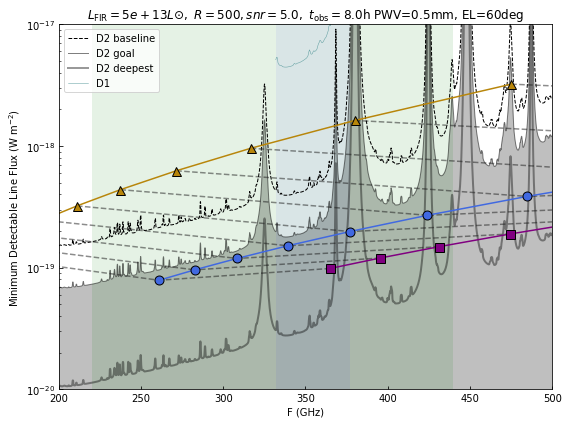

In [66]:
def MDLFdemo2_deepest():
    
    F = np.linspace(100,1000,9001)*1e9 # frequency range
    # F = 3.5e11 # single frequency
    HPBW = D2HPBW(F)
    eta_mb = eta_mb_ruze(F=F,LFlimit=0.8,sigma=37e-6) * 0.9 # see specs, 0.9 is from EM, ruze is from ASTE
    
    D2goal_input ={
        'F' : F,
        'pwv':0.5,
        'EL':60.,
        'R' : 500,
        'eta_M1_spill' : 0.99,
        'eta_M2_spill' : 0.90,
        'eta_wo' : 0.99,
        'eta_co' : 0.65, # product of co spillover, qo filter
        'eta_lens_antenna_rad' : 0.81, # D2_2V3.pdf, p14: front-to-back ratio 0.93 * reflection efficiency 0.9 * matching 0.98 * antenna spillover 0.993
        'eta_circuit' : 0.35, # 'Alejandro Efficiency', from the feedpoint of the antenna to being absorbed in the KID.
        'eta_IBF' : 0.6,
        'KID_excess_noise_factor' : 1.1,
        'theta_maj' : HPBW,
        'theta_min' : HPBW,
        'eta_mb' : eta_mb,
        'Tb_cmb' : 2.725,
        'Tp_amb' : 273.,
        'Tp_cabin' : 290.,
        'Tp_co' : 4.,
        'Tp_chip' : 0.12,
        'snr' : 5,
        'obs_hours' :8.,
        'on_source_fraction':0.4*0.9 # ON-OFF 40%, calibration overhead of 10%
    }

    D2goal = dsm.spectrometer_sensitivity(**D2goal_input)
    
    
    D2baseline_input = {
        'F' : F,
        'pwv':0.5,
        'EL':60.,
        'R' : 500, # <= Goal is 500
        'eta_M1_spill' : 0.99,
        'eta_M2_spill' : 0.90,
        'eta_wo' : 0.99,
        'eta_co' : 0.65, # product of co spillover, qo filter
        'eta_lens_antenna_rad' : 0.81, # D2_2V3.pdf, p14: front-to-back ratio 0.93 * reflection efficiency 0.9 * matching 0.98 * antenna spillover 0.993
        'eta_circuit' : 0.35 * 0.5, # <= eta_inst Goal 16%, Baseline 8% 
        'eta_IBF' : 0.4, # <= Goal 0.6 
        'KID_excess_noise_factor' : 1.2, # Goal 1.1
        'theta_maj' : HPBW,
        'theta_min' : HPBW,
        'eta_mb' : eta_mb,
        'Tb_cmb' : 2.725,
        'Tp_amb' : 273.,
        'Tp_cabin' : 290.,
        'Tp_co' : 4.,
        'Tp_chip' : 0.12,
        'snr' : 5,
        'obs_hours' :8.,
        'on_source_fraction':0.3*0.8/1.2 # <= Goal 0.4*0.9/1.1
    }
    
    D2baseline = dsm.spectrometer_sensitivity(**D2baseline_input)
    
    F_D1 = np.linspace(332,377,100)*1e9 # frequency range
    # F = 3.5e11 # single frequency

    D1_input ={
        'F' : F_D1,
        'pwv':1.5,
        'EL':60.,
        'R' : 380,
        'eta_M1_spill' : 0.99,
        'eta_M2_spill' : 0.90,
        'eta_wo' : 0.99,
        'eta_co' : 0.65, # product of co spillover, qo filter
        'eta_lens_antenna_rad' : 0.81, # D2_2V3.pdf, p14: front-to-back ratio 0.93 * reflection efficiency 0.9 * matching 0.98 * antenna spillover 0.993
        'eta_circuit' : 0.35 * 0.1, # !! Multiply with a factor to reduce D1 optical effiiciency to ~2%
        'eta_IBF' : 0.6,
        'KID_excess_noise_factor' : 1.0,
        'theta_maj' : 31.4*np.pi/180./60./60.,
        'theta_min' : 22.8*np.pi/180./60./60.,
        'eta_mb' : 0.34,
        'Tb_cmb' : 2.725,
        'Tp_amb' : 273.,
        'Tp_cabin' : 290.,
        'Tp_co' : 4.,
        'Tp_chip' : 0.12,
        'snr' : 5,
        'obs_hours' :8.,
        'on_source_fraction':(1./8.)*0.9 # ON-OFF 40%, calibration overhead of 10%
    }

    D1 = dsm.spectrometer_sensitivity(**D1_input)
    
    ### Calculation of Astronomical line, developed by Y. Tamura --------
    
    ## total infrared luminosity (L_Sun)
    Ltir = 5.e+13

    ## would you like to use line-to-TIR ratios for dwarf galaxies?
    switch_dwarf = False

    ## line-to-TIR luminosity ratio (L_Sun or Watt)
    Rcii_B08, Roiii_B08, Roi_B08 = 1.3e-3, 8.0e-4, 1.0e-3 ## from Brauer+2008
    Rcii_DGS, Roiii_DGS, Roi_DGS = 2.5e-3, 5.0e-3, 1.7e-3 ## from Cormier+2015

    ## rest frequency (GHz)
    f_cii, f_oiii, f_oi = 1900.5369, 3393.00062, 4744.8

    ## redshift
#     exec(open(desim_path + '/Dl_at_z2.py').read())
    #z = concatenate( (arange(0.1,0.5,0.1), arange(0.5,2,0.5), arange(2,6,1)), 1)
    #z = concatenate( (arange(0.1,0.5,0.1), arange(0.5,2,0.5), arange(2,12,1)), 1)
    #z = concatenate( (arange(0.1,1,0.1), arange(1,8,0.2)), 1)
    z = np.array([3,4,5,6,7,8,9,10,11,12])
    d_l = Dl_at_z(z) ## luminosity distance (Mpc)

    Fcii_B08  = flux_from_line_luminosity(z, d_l, f_cii/(1+z),  Ltir * Rcii_B08)
    Foiii_B08 = flux_from_line_luminosity(z, d_l, f_oiii/(1+z), Ltir * Roiii_B08)
    Foi_B08   = flux_from_line_luminosity(z, d_l, f_oi/(1+z),   Ltir * Roi_B08)

    Fcii_DGS  = flux_from_line_luminosity(z, d_l, f_cii/(1+z),  Ltir * Rcii_DGS)
    Foiii_DGS = flux_from_line_luminosity(z, d_l, f_oiii/(1+z), Ltir * Roiii_DGS)
    Foi_DGS   = flux_from_line_luminosity(z, d_l, f_oi/(1+z),   Ltir * Roi_DGS)

    if switch_dwarf:
        Fcii_DGS, Foiii_DGS, Foi_DGS = Fcii_DGS, Foiii_DGS, Foi_DGS
    else:
        Fcii_DGS, Foiii_DGS, Foi_DGS = Fcii_B08, Foiii_B08, Foi_B08

    ### Calculation of Astronomical line ends here --------
    
    ### Plot-------------------
    
    fig, ax = plt.subplots(1,1,figsize=(8,6))

    Fmin = 200
    Fmax = 500

    # Need to crop the data for the filling
    ind = (D2goal['F']<Fmax * 1e9) & (D2goal['F']>Fmin * 1e9)

    ax.plot(D2baseline['F']/1e9,D2baseline['MDLF'],'--',linewidth=1,color='black',alpha=1,label='D2 baseline')
    ax.plot(D2goal['F']/1e9,D2goal['MDLF'],linewidth=1,color='black',alpha=0.5,label='D2 goal')
    
    ax.plot(D2goal['F']/1e9,D2goal['MDLF']*np.sqrt(8*0.4*0.9/120)    ,linewidth=2,color='black',alpha=0.4,label='D2 deepest')

    ax.fill_between(D2goal['F'][ind]/1e9,10**-21,D2goal['MDLF'][ind],
                   facecolor='grey',alpha=0.5)
    ax.plot(D1['F']/1e9,D1['MDLF'],linewidth=0.5,color='cadetblue',alpha=1,label='D1')
    ax.fill_between([220,440],10**-21,[1e-15,1e-15],
                   facecolor='green',alpha=0.1) # ,label='D2 coverage'
    ax.fill_between([332,377],10**-21,[1e-15,1e-15],
                   facecolor='blue',alpha=0.05) # ,label='D1 coverage'

    # Astronomical lines
    for i in range(len(z)):
        x = np.array( [f_cii, f_oiii] ) / (1 + z[i])
        y = np.array( [Fcii_DGS[i], Foiii_DGS[i]] )
        plt.plot(x, y, '--', color='0.1',alpha=0.5)

    for i in range(len(z)):
        x = np.array( [f_oi, f_oiii] ) / (1 + z[i])
        y = np.array( [Foi_DGS[i], Foiii_DGS[i]] )
        plt.plot(x, y, '--', color='0.1',alpha=0.5)

    plt.plot(f_cii/(1+z),  Fcii_DGS,  "^-", linewidth=1.5, color='darkgoldenrod', markersize=9,markeredgecolor='black')
    plt.plot(f_oiii/(1+z), Foiii_DGS, "o-", linewidth=1.5, color='royalblue', markersize=9,markeredgecolor='black')
    plt.plot(f_oi/(1+z),   Foi_DGS,   "s-", linewidth=1.5, color='purple', markersize=9,markeredgecolor='black')


    ax.set_xlabel("F (GHz)")
    ax.set_ylabel("Minimum Detectable Line Flux ($\mathrm{W\ m^{-2}}$)")
    ax.set_yscale('log')
    ax.set_xlim([Fmin,Fmax])
    ax.set_ylim([10**-20,10**-17])
    ax.tick_params(direction='in',which='both')
    ax.set_title("$L_\mathrm{FIR}="+"{:.0e}".format(Ltir)+
                "L\mathrm{\odot},\ R="+str(int(D2goal['R'][0]))+", snr=" + str(D2goal['snr'][0]) + ',\ t_\mathrm{obs}=' 
                 +str(D2goal['obs_hours'][0])
                 +'\mathrm{h}$ PWV=' + str(D2goal['PWV'][0]) + "mm, EL="+str(int(D2goal['EL'][0]))+'deg',
                 fontsize=12)
    ax.legend()
    plt.tight_layout()
    # plt.savefig(desim_path + "/examples/output/MDLF_baseline_goal_D1_lines.pdf",bbox_inches="tight",transparent=True)
    
MDLFdemo2_deepest()

## Photon Bunching

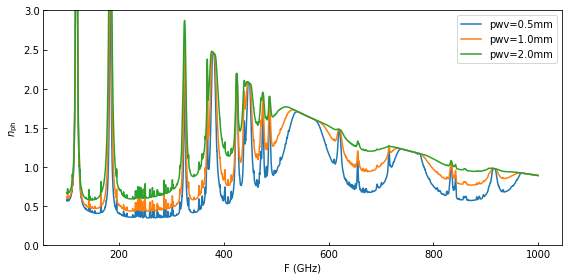

In [53]:
def Bunchingdemo1():
    F = np.linspace(100,1000,9001)*1e9
    HPBW = D2HPBW(F)
    eta_mb = eta_mb_ruze(F=F,LFlimit=0.8,sigma=37e-6) * 0.9 # see specs, 0.9 is from EM, ruze is from ASTE

    fig, ax = plt.subplots(1,1,figsize=(8,4)) # facecolor='w'
    
    pwvarr = [0.5,1,2]
    
    for pwv in pwvarr:
        D2goal_input ={
            'F' : F,
            'pwv':pwv,
            'EL':60.,
            'R' : 500,
            'eta_M1_spill' : 0.99,
            'eta_M2_spill' : 0.90,
            'eta_wo' : 0.99,
            'eta_co' : 0.65, # product of co spillover, qo filter
            'eta_lens_antenna_rad' : 0.81, # D2_2V3.pdf, p14: front-to-back ratio 0.93 * reflection efficiency 0.9 * matching 0.98 * antenna spillover 0.993
            'eta_circuit' : 0.35, # 'Alejandro Efficiency', from the feedpoint of the antenna to being absorbed in the KID.
            'eta_IBF' : 0.6,
            'KID_excess_noise_factor' : 1.1,
            'theta_maj' : HPBW,
            'theta_min' : HPBW,
            'eta_mb' : eta_mb,
            'Tb_cmb' : 2.725,
            'Tp_amb' : 273.,
            'Tp_cabin' : 290.,
            'Tp_co' : 4.,
            'Tp_chip' : 0.12,
            'snr' : 5,
            'obs_hours' :8.,
            'on_source_fraction':0.4*0.9 # ON-OFF 40%, calibration overhead of 10%
        }

        D2goal = dsm.spectrometer_sensitivity(**D2goal_input)


        ax.plot(D2goal['F']/1e9,
                    D2goal['n_ph'],
                label='pwv='+'{:.1f}'.format(pwv)+'mm'
                   )
    
    ax.set_xlabel("F (GHz)")
    ax.set_ylabel("$n_\mathrm{ph}$")
    ax.set_ylim([0,3])
    ax.tick_params(direction='in',which='both')
    plt.legend()
    plt.tight_layout()

Bunchingdemo1()

## MDLF vs instrument optical efficiency 

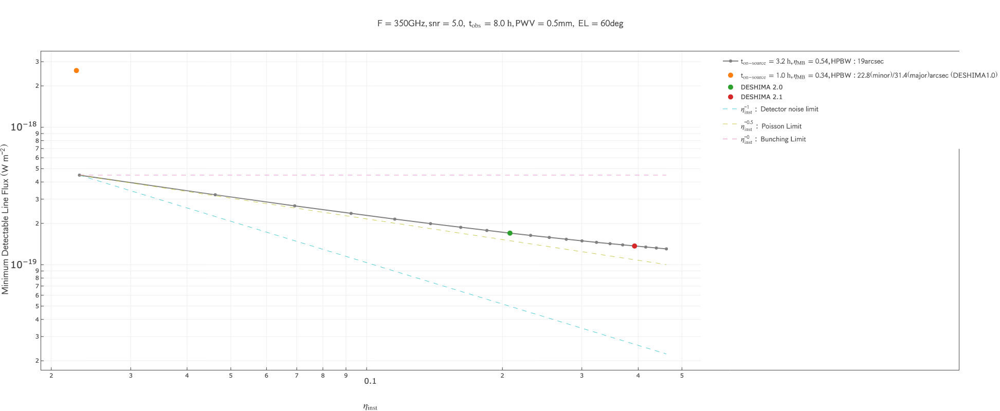

In [54]:
def MDLF_etainst_demo1():

    F = 3.5e11 # single frequency
    HPBW = D2HPBW(F)
    eta_mb = eta_mb_ruze(F=F,LFlimit=0.8,sigma=37e-6) * 0.9 # see specs, 0.9 is from EM, ruze is from ASTE


    eta_circuit = np.linspace(0.05,1,20)

    D2_in ={
        'F' : F,
        'pwv':0.5,
        'EL':60.,
        'R' : 500,
        'eta_M1_spill' : 0.99,
        'eta_M2_spill' : 0.90,
        'eta_wo' : 0.99,
        'eta_co' : 0.65, # product of co spillover, qo filter
        'eta_lens_antenna_rad' : 0.81, # D2_2V3.pdf, p14: front-to-back ratio 0.93 * reflection efficiency 0.9 * matching 0.98 * antenna spillover 0.993
        'eta_circuit' : eta_circuit, # 'Alejandro Efficiency', from the feedpoint of the antenna to being absorbed in the KID.
        'theta_maj' : HPBW,
        'theta_min' : HPBW,
        'eta_mb' : eta_mb,
        'Tb_cmb' : 2.725,
        'Tp_amb' : 273.,
        'Tp_cabin' : 290.,
        'Tp_co' : 4.,
        'Tp_chip' : 0.12,
        'snr' : 5,
        'obs_hours' :8.,
        'on_source_fraction':0.4
    }

    D2 = dsm.spectrometer_sensitivity(**D2_in)

    cropped = D2[(D2['MDLF'] < 1e-16) & (D2['MDLF'] > 1e-20)]  

    tr_MDLF_D2 = go.Scatter(
            x = cropped['eta_inst'],
            y = cropped['MDLF'],
            mode='lines+markers',
            name="$\mathsf{PWV="+str(D2['PWV'][0]) + "mm,\ EL="+str(int(D2['EL'][0]))+'deg,\ t_\mathrm{on-source}='+str(D2_in['obs_hours']*D2_in['on_source_fraction'])+'\ \mathrm{h}}$',
        )

    data = [tr_MDLF_D2]

    # DESHIMA 1.0
    D1_in ={
        'F' : F,
        'pwv':0.5,
        'EL':60.,
        'R' : 400,
        'eta_M1_spill' : 0.99,
        'eta_M2_spill' : 0.90,
        'eta_wo' : 0.99,
        'eta_co' : 0.4, # product of co spillover, qo filter
        'eta_lens_antenna_rad' : 0.81, # D2_2V3.pdf, p14: front-to-back ratio 0.93 * reflection efficiency 0.9 * matching 0.98 * antenna spillover 0.993
        'eta_circuit' : 0.08, # 'Alejandro Efficiency', from the feedpoint of the antenna to being absorbed in the KID.
        'theta_maj' : 31.4*np.pi/180./60./60.,
        'theta_min' : 22.8*np.pi/180./60./60.,
        'eta_mb' : 0.34,
        'Tb_cmb' : 2.725,
        'Tp_amb' : 273.,
        'Tp_cabin' : 290.,
        'Tp_co' : 4.,
        'Tp_chip' : 0.12,
        'snr' : 5,
        'obs_hours' :8.,
        'on_source_fraction':1./8.
    }

    D1 = dsm.spectrometer_sensitivity(**D1_in)


    tr_MDLF_sweep = go.Scatter(
            x = cropped['eta_inst'],
            y = cropped['MDLF'],
            mode='lines+markers',
            name="$\mathsf{t_\mathrm{on-source}="+str(D2_in['obs_hours']*D2_in['on_source_fraction'])+" \ \mathrm{h}, \eta_\mathrm{MB}="+str(round(D2['eta_mb'][0],2))+ ",HPBW:"+ str(int(D2['theta_maj'][0]*180/np.pi*60*60)) +"arcsec}$",
            line = dict(
                width = 2,
                color = 'gray'
            )
        )

    ind = (cropped['eta_inst']-0.2).abs().idxmin()
    D2point = cropped[ind:ind+1]

    tr_MDLF_D2 = go.Scatter(
            x = D2point['eta_inst'],
            y = D2point['MDLF'],
            mode='markers',
            name="DESHIMA 2.0",
            marker = dict(
            size = 10
            )
        )

    ind = (cropped['eta_inst']-0.4).abs().idxmin()
    D2p1point = cropped[ind:ind+1]

    tr_MDLF_D2p1 = go.Scatter(
            x = D2p1point['eta_inst'],
            y = D2p1point['MDLF'],
            mode='markers',
            name="DESHIMA 2.1",
            marker = dict(
            size = 10
            )
        )

    tr_MDLF_D1 = go.Scatter(
            x = D1['eta_inst'],
            y = D1['MDLF'],
            mode='markers',
            name="$\mathsf{t_\mathrm{on-source}="+str(D1_in['obs_hours']*D1_in['on_source_fraction'])+" \ \mathrm{h},\eta_\mathrm{MB}="+str(D1_in['eta_mb'])+", HPBW:22.8 (minor)/ 31.4 (major) arcsec" +"\ (DESHIMA 1.0)}$",
            marker = dict(
            size = 10
            )
        )

    linear = cropped['MDLF'][0] * (cropped['eta_inst']/cropped['eta_inst'][0])**-1
    sqrt = cropped['MDLF'][0] * (cropped['eta_inst']/cropped['eta_inst'][0])**-0.5
    independent = cropped['MDLF'][0] * (cropped['eta_inst']/cropped['eta_inst'][0])**-0

    tr_linear = go.Scatter(
            x = cropped['eta_inst'],
            y = linear,
            mode='lines',
            name="$\mathsf{\eta_\mathrm{inst}^{-1}:\ Detector\ noise\ limit}$",
            line = dict(
                color='rgba(23, 190, 207,0.8)',
                width = 1,
                dash = 'dash')
        )

    tr_sqrt = go.Scatter(
            x = cropped['eta_inst'],
            y = sqrt,
            mode='lines',
            name="$\mathsf{\eta_\mathrm{inst}^{-0.5}:\ Poisson\ Limit}$",
            line = dict(
                color = ('rgba(188, 189, 34, 0.8)'),
                width = 1,
                dash = 'dash')
        )

    tr_independent = go.Scatter(
            x = cropped['eta_inst'],
            y = independent,
            mode='lines',
            name="$\mathsf{\eta_\mathrm{inst}^{-0}:\ Bunching\ Limit}$",
            line = dict(
                color = ('rgba(227, 119, 194, 0.8)'),
                width = 1,
                dash = 'dash')
        )

    data = [tr_MDLF_sweep,tr_MDLF_D1,tr_MDLF_D2,tr_MDLF_D2p1,tr_linear,tr_sqrt,tr_independent]

    layout = py.graph_objs.Layout(
        title= "$\mathsf{F=" +str(int(F/1e9))+ "GHz, snr=" + str(D2['snr'][0]) + ',\ t_\mathrm{obs}=' + str(D2_in['obs_hours'])+"\ \mathrm{h}, PWV="+str(D2['PWV'][0]) + "mm,\ EL="+str(int(D2['EL'][0]))+'deg}$',
        titlefont = {"size": 15},
        xaxis=dict(
            title='$\mathsf{\eta_\mathrm{inst}}$',
            type='log',
            showgrid=True,
            mirror=True,
            ticks='inside',
            showline=True,
            titlefont=dict(
                size=30,
            ),
            tickfont=dict(
                size=15
            ),
                  ),
        yaxis=dict(title='$\mathsf{Minimum\ Detectable\ Line\ Flux\ (W\ m^{-2})}$',
                   type='log',
               showgrid=True,
               mirror=True,
               ticks='inside',
               showline=True,
               titlefont=dict(
                size=30,
            ),
               tickfont=dict(
                size=15
            ),
                  ),
        width=800, height=800,
        showlegend=True
    )

    fig = py.graph_objs.Figure(data=data, layout=layout)

    py.offline.iplot(fig)

#     pio.write_json(fig, desim_path + '/examples/output/MDLFvsEta.plotly')
#     pio.write_image(fig, desim_path + '/examples/output/MDLFvsEta_.pdf')

MDLF_etainst_demo1()

## Equivalent Trx

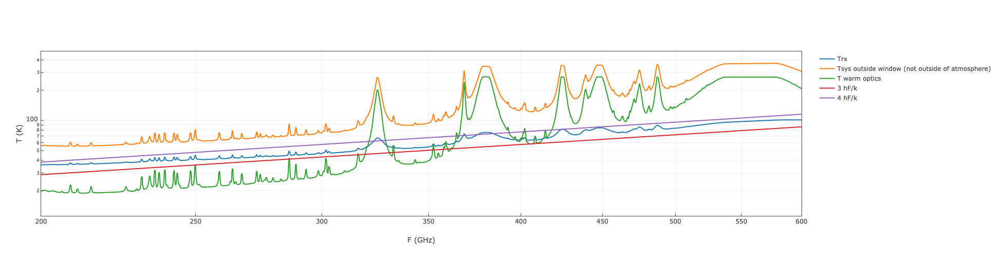

In [55]:
def Trxdemo1():

    F = np.linspace(100,1000,9001)*1e9 # frequency range
    # F = 3.5e11 # single frequency
    HPBW = D2HPBW(F)
    eta_mb = eta_mb_ruze(F=F,LFlimit=0.8,sigma=37e-6) * 0.9 # see specs, 0.9 is from EM, ruze is from ASTE


    D2_in ={
        'F' : F,
        'pwv':0.5,
        'EL':60.,
        'R' : 500,
        'eta_M1_spill' : 0.99,
        'eta_M2_spill' : 0.90,
        'eta_wo' : 0.99,
        'eta_co' : 0.65, # product of co spillover, qo filter
        'eta_lens_antenna_rad' : 0.81, # D2_2V3.pdf, p14: front-to-back ratio 0.93 * reflection efficiency 0.9 * matching 0.98 * antenna spillover 0.993
        'eta_circuit' : 0.4, # 'Alejandro Efficiency', from the feedpoint of the antenna to being absorbed in the KID.
        'theta_maj' : HPBW,
        'theta_min' : HPBW,
        'eta_mb' : eta_mb,
        'Tb_cmb' : 2.725,
        'Tp_amb' : 273.,
        'Tp_cabin' : 290.,
        'Tp_co' : 4.,
        'Tp_chip' : 0.12,
        'snr' : 5,
        'obs_hours' :8.,
        'on_source_fraction':0.4
    }

    D2 = dsm.spectrometer_sensitivity(**D2_in)

    # Interactive plot
    cropped = D2[(D2['MDLF'] < 1e-16) & (D2['MDLF'] > 1e-20)]  

    tr_Trx = go.Scatter(
            x = cropped['F']/1e9,
            y = cropped['equivalent_Trx'],
            mode='lines',
            name="Trx",
        )

    tr_Tsys = go.Scatter(
            x = cropped['F']/1e9,
            y = cropped['equivalent_Trx'] + cropped['Tb_wo'],
            mode='lines',
            name="Tsys outside window (not outside of atmosphere)",
        )

    tr_Two = go.Scatter(
            x = cropped['F']/1e9,
            y = cropped['Tb_wo'],
            mode='lines',
            name="T warm optics",
        )

    tr_3QN = go.Scatter(
            x = cropped['F']/1e9,
            y = 3*h*cropped['F']/k,
            mode='lines',
            name="3 hF/k",
        )

    tr_4QN = go.Scatter(
            x = cropped['F']/1e9,
            y = 4*h*cropped['F']/k,
            mode='lines',
            name="4 hF/k",
        )

    data = [tr_Trx,tr_Tsys,tr_Two,tr_3QN,tr_4QN]

    layout = py.graph_objs.Layout(
    #     title= "snr=" + str(D2['snr'][0]) + ', t_obs=' + str(D2_in['obs_hours'])+' h, t_onsource='+str(D2_in['obs_hours']*D2_in['on_source_fraction'])+' h',
        titlefont = {"size": 15},
        xaxis=dict(
            title='F (GHz)',
            type='log',
            showgrid=True,
            range=np.log10([200, 600]),
            mirror=True,
            ticks='inside',
            showline=True
                  ),
        yaxis=dict(title='T (K)',
                   type='log',
               showgrid=True,
    #            range=[1e-21, 1e-19],
               mirror=True,
               ticks='inside',
               showline=True
                  ),
        width=800, height=500,
        showlegend=True
    )

    fig = py.graph_objs.Figure(data=data, layout=layout)

    py.offline.iplot(fig)

# Export plot as files
# pio.write_json(fig, desim_path + '/examples/output/equivalent_Trx.plotly')
# pio.write_image(fig, desim_path + '/examples/output/equivalent_Trx.pdf')

Trxdemo1()

## Weakest signal to be detected by DESHIMA 2.0

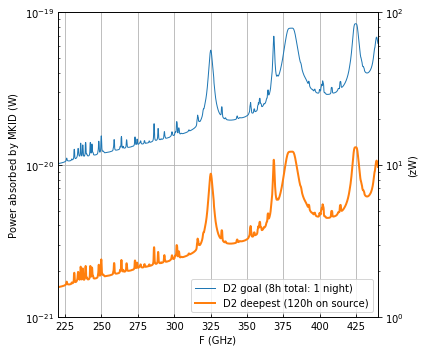

In [65]:
def weaksignaldemo1():
    
    F = np.linspace(100,1000,9001)*1e9 # frequency range
    # F = 3.5e11 # single frequency
    HPBW = D2HPBW(F)
    eta_mb = eta_mb_ruze(F=F,LFlimit=0.8,sigma=37e-6) * 0.9 # see specs, 0.9 is from EM, ruze is from ASTE

    D2goal_input ={
        'F' : F,
        'pwv':0.5,
        'EL':60.,
        'R' : 500,
        'eta_M1_spill' : 0.99,
        'eta_M2_spill' : 0.90,
        'eta_wo' : 0.99,
        'eta_co' : 0.65, # product of co spillover, qo filter
        'eta_lens_antenna_rad' : 0.81, # D2_2V3.pdf, p14: front-to-back ratio 0.93 * reflection efficiency 0.9 * matching 0.98 * antenna spillover 0.993
        'eta_circuit' : 0.35, # 'Alejandro Efficiency', from the feedpoint of the antenna to being absorbed in the KID.
        'eta_IBF' : 0.6,
        'KID_excess_noise_factor' : 1.1,
        'theta_maj' : HPBW,
        'theta_min' : HPBW,
        'eta_mb' : eta_mb,
        'Tb_cmb' : 2.725,
        'Tp_amb' : 273.,
        'Tp_cabin' : 290.,
        'Tp_co' : 4.,
        'Tp_chip' : 0.12,
        'snr' : 5,
        'obs_hours' :8.,
        'on_source_fraction':0.4*0.9 # ON-OFF 40%, calibration overhead of 10%
    }

    D2goal = dsm.spectrometer_sensitivity(**D2goal_input)
    
    D2deepest_input ={
        'F' : F,
        'pwv':0.5,
        'EL':60.,
        'R' : 500,
        'eta_M1_spill' : 0.99,
        'eta_M2_spill' : 0.90,
        'eta_wo' : 0.99,
        'eta_co' : 0.65, # product of co spillover, qo filter
        'eta_lens_antenna_rad' : 0.81, # D2_2V3.pdf, p14: front-to-back ratio 0.93 * reflection efficiency 0.9 * matching 0.98 * antenna spillover 0.993
        'eta_circuit' : 0.35, # 'Alejandro Efficiency', from the feedpoint of the antenna to being absorbed in the KID.
        'eta_IBF' : 0.6,
        'KID_excess_noise_factor' : 1.1,
        'theta_maj' : HPBW,
        'theta_min' : HPBW,
        'eta_mb' : eta_mb,
        'Tb_cmb' : 2.725,
        'Tp_amb' : 273.,
        'Tp_cabin' : 290.,
        'Tp_co' : 4.,
        'Tp_chip' : 0.12,
        'snr' : 5,
        'obs_hours' :60.,
        'on_source_fraction':1 # Here we don't consider overhead, Soh requires 60 h on-source
    }

    D2deepest = dsm.spectrometer_sensitivity(**D2deepest_input)

    fig, ax = plt.subplots(1,1,figsize=(6,5))

    Fmin = 220
    Fmax = 440
    snr = 5

    
    ax.plot(D2goal['F']/1e9,D2goal['NEPkid']/ np.sqrt(2*8*0.4*0.9*60*60)/snr*np.sqrt(2), # the last sqrt(2) is for ON-OFF subtraction. 
            linewidth=1,alpha=1,label='D2 goal (8h total: 1 night)')
    ax.plot(D2deepest['F']/1e9,D2deepest['NEPkid']/ np.sqrt(2*120*60*60)/snr*np.sqrt(2), # the last sqrt(2) is for ON-OFF subtraction.
            linewidth=2,alpha=1,label='D2 deepest (120h on source)')


    ax2 = ax.twinx()
    ax2.set_ylim(1, 100)
    ax2.set_yscale('log')
    ax2.set_ylabel("(zW)")

    ax.set_xlabel("F (GHz)")
    ax.set_ylabel("Power absorbed by MKID ($\mathsf{W}$)")
    ax.set_yscale('log')
    ax.set_xlim([Fmin,Fmax])
    ax.set_ylim([10**-21,10**-19])
    ax.tick_params(direction='in',which='both')
    ax.grid()
    ax.legend()
    plt.tight_layout()
#     plt.savefig("power_to_detect_at_KID.pdf",bbox_inches="tight",transparent=True)
    
weaksignaldemo1() 